In [4]:
import matplotlib.pyplot as plt 
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np

In [17]:
df = pd.read_csv("/Users/annahartman/gabeKaggle-1/cs-training.csv")
df.drop("Unnamed: 0", axis=1, inplace=True)
df.dropna(inplace=True)

In [18]:
df.head()

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


In [19]:
target_names = {
    0:'no',
    1:'yes'
}

In [47]:
pca = PCA(n_components=2)

In [48]:
pca_target = df.iloc[:, 0]
pca_features = df.iloc[:, 1:]

In [56]:
pca_features

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0
...,...,...,...,...,...,...,...,...,...,...
149994,0.385742,50,0,0.404293,3400.0,7,0,0,0,0.0
149995,0.040674,74,0,0.225131,2100.0,4,0,1,0,0.0
149996,0.299745,44,0,0.716562,5584.0,4,0,1,0,2.0
149998,0.000000,30,0,0.000000,5716.0,4,0,0,0,0.0


In [57]:
pca_target
y = pca_target

In [58]:
pca_final = pca.fit_transform(pca_features)

pca_df = pd.DataFrame(
    data=pca_final, 
    columns=['PC1', 'PC2'])

In [59]:
pca_df

,PC1,PC2
0,2449.799032,-23.717372
1,-4070.198505,-29.928671
2,-3628.198827,-29.590971
3,-3370.199133,-29.420743
4,56917.779511,21.689244
...,...,...
120264,-3270.198641,-28.967555
120265,-4570.197234,-30.249528
120266,-1086.200028,-26.803622
120267,-954.200057,-27.408286


In [60]:
pca_df['target'] = y
pca_df['target'] = pca_df['target'].map(target_names)
 
pca_df

,PC1,PC2,target
0,2449.799032,-23.717372,yes
1,-4070.198505,-29.928671,no
2,-3628.198827,-29.590971,no
3,-3370.199133,-29.420743,no
4,56917.779511,21.689244,no
...,...,...,...
120264,-3270.198641,-28.967555,no
120265,-4570.197234,-30.249528,NaN
120266,-1086.200028,-26.803622,no
120267,-954.200057,-27.408286,no


In [61]:
pca.explained_variance_

array([2.06919005e+08, 1.80006152e+05])

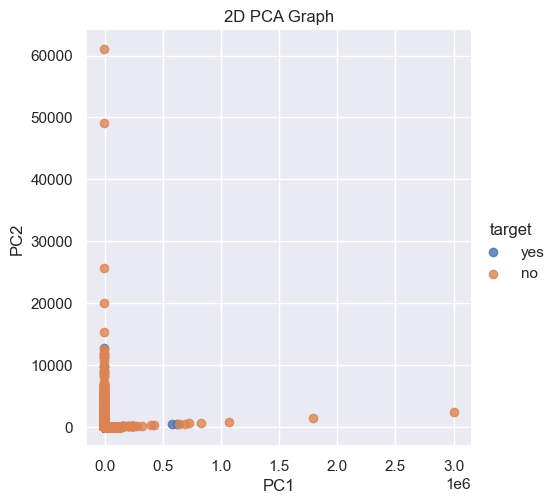

In [63]:
import matplotlib.pyplot as plt 
import seaborn as sns
sns.set()
 
plot = sns.lmplot(
    x='PC1', 
    y='PC2', 
    data=pca_df, 
    hue='target', 
    fit_reg=False, 
    legend=True
    )
 
plt.title('2D PCA Graph')
plt.show()